In [1]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import cornrows

631.0007923438926


In [2]:
def rcsetup():
    plt.rc("figure", dpi=120, facecolor=(1, 1, 1))
    plt.rc("font", family='stixgeneral', size=15)
    plt.rc("axes", titlesize=19)
    plt.rc("axes", facecolor=(1, 1, 1))
    plt.rc("mathtext", fontset='cm')

rcsetup()

In [3]:
def truncate_to_sigfigs(number, k):
    if number == 0:
        return 0.0
    else:
        # Calculate the factor to multiply and divide by
        factor = 10 ** (np.ceil(np.log10(number)) - 2)
        
        # Truncate the number by converting to integer and back
        truncated_number = int(number / factor) * factor
        
        return truncated_number

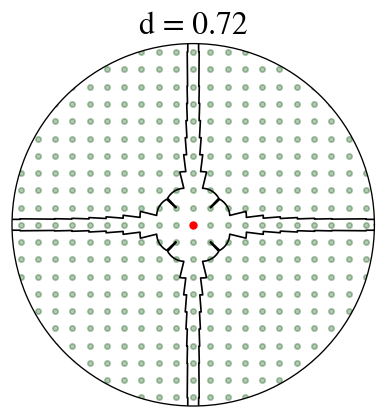

In [13]:
import matplotlib.pyplot as plt
import numpy as np

d = .72
thetas = np.linspace(0, 2 * np.pi, num=2001)
max_rectangle_lengths = np.array([cornrows.max_length(d, theta) for theta in thetas])

# Create a polar subplot
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

# Plot the data
ax.plot(thetas, max_rectangle_lengths, color=(0,0,0), lw=1)  # You can customize the plot with different markers or lines

# add grid
xx, yy = np.meshgrid(np.arange(-10,11), np.arange(-10,11))
ax.scatter(np.arctan2(yy, xx), (xx ** 2 + yy ** 2) ** .5, color=(0,.3,0,.3), s=(4.5 * d) ** 2)
ax.scatter(0, 0, color=(1,0,0), s=4**2)

# Customize the plot
ax.set_rmax(10.5)  # Set the maximum radial limit
ax.set_rticks([])  # Set the radial ticks
ax.set_thetagrids([])
ax.set_rlabel_position(-22.5)  # Position of radial labels
ax.set_title(f'd = {d:.5g}')

# Show the plot
plt.show()

In [33]:
def generate_plot(d, idx=0):
    
    thetas = np.linspace(0, 2 * np.pi, num=2001)
    max_rectangle_lengths = np.array([cornrows.max_length(d, theta) for theta in thetas])

    # Create a polar subplot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

    # Plot the data
    ax.plot(thetas, max_rectangle_lengths, color=(0,0,0), lw=1)  # You can customize the plot with different markers or lines

    # add grid
    xx, yy = np.meshgrid(np.arange(-10,11), np.arange(-10,11))
    ax.scatter(np.arctan2(yy, xx), (xx ** 2 + yy ** 2) ** .5, color=(.1,.5,.2), s=(4.5 * d) ** 2)
    ax.scatter(0, 0, color=(1,0,0), s=4**2)

    # Customize the plot
    ax.set_rmax(10.5)  # Set the maximum radial limit
    ax.set_rticks([])  # Set the radial ticks
    ax.set_thetagrids([])
    ax.set_rlabel_position(-22.5)  # Position of radial labels
    ax.set_title(f'd = {d:.5g}')
    plt.savefig(f'cornrow_plots/frame_{idx}.png')
    
    return ax

<PolarAxesSubplot:title={'center':'d = 0.9'}>

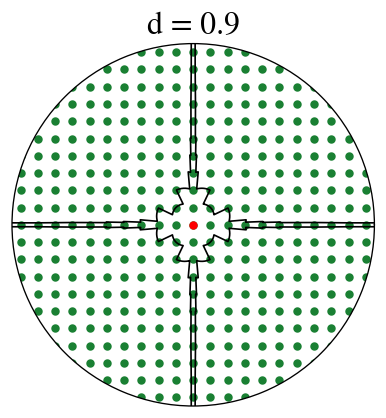

In [34]:
generate_plot(.9)

In [38]:
ds = [truncate_to_sigfigs(d, 2) for d in np.logspace(-.05, -.8, num=200)]

<ipython-input-33-74cbb13bb87e>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})


[<PolarAxesSubplot:title={'center':'d = 0.89'}>,
 <PolarAxesSubplot:title={'center':'d = 0.88'}>,
 <PolarAxesSubplot:title={'center':'d = 0.87'}>,
 <PolarAxesSubplot:title={'center':'d = 0.86'}>,
 <PolarAxesSubplot:title={'center':'d = 0.86'}>,
 <PolarAxesSubplot:title={'center':'d = 0.85'}>,
 <PolarAxesSubplot:title={'center':'d = 0.84'}>,
 <PolarAxesSubplot:title={'center':'d = 0.83'}>,
 <PolarAxesSubplot:title={'center':'d = 0.83'}>,
 <PolarAxesSubplot:title={'center':'d = 0.82'}>,
 <PolarAxesSubplot:title={'center':'d = 0.81'}>,
 <PolarAxesSubplot:title={'center':'d = 0.81'}>,
 <PolarAxesSubplot:title={'center':'d = 0.8'}>,
 <PolarAxesSubplot:title={'center':'d = 0.79'}>,
 <PolarAxesSubplot:title={'center':'d = 0.78'}>,
 <PolarAxesSubplot:title={'center':'d = 0.78'}>,
 <PolarAxesSubplot:title={'center':'d = 0.77'}>,
 <PolarAxesSubplot:title={'center':'d = 0.76'}>,
 <PolarAxesSubplot:title={'center':'d = 0.76'}>,
 <PolarAxesSubplot:title={'center':'d = 0.75'}>,
 <PolarAxesSubplot:ti

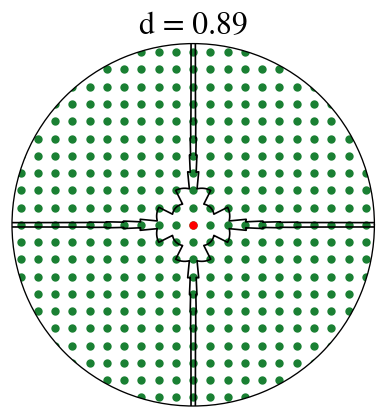

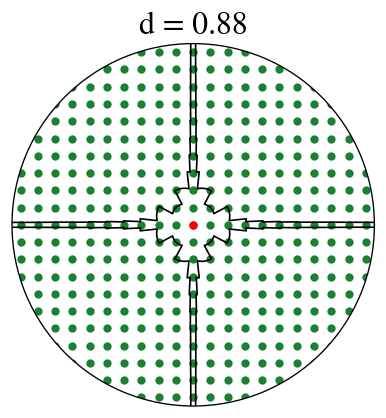

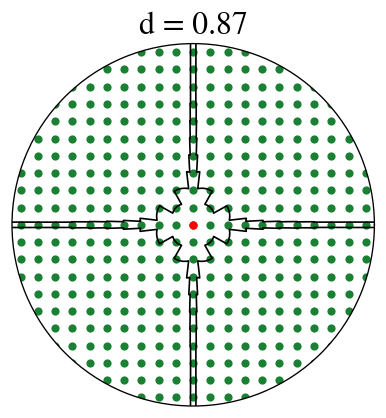

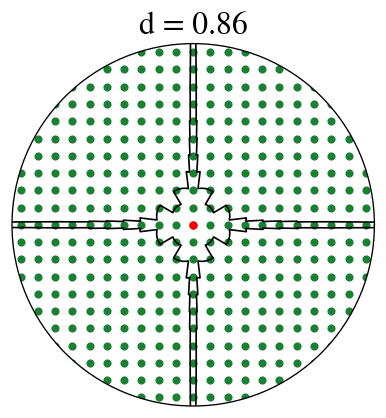

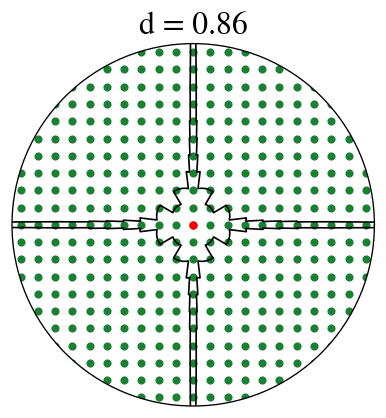

...

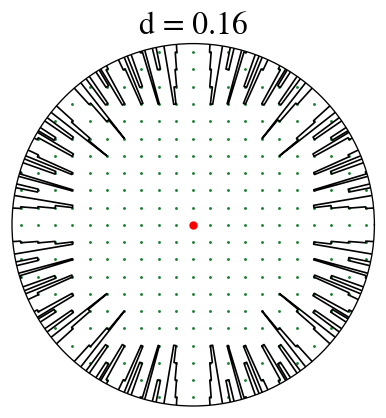

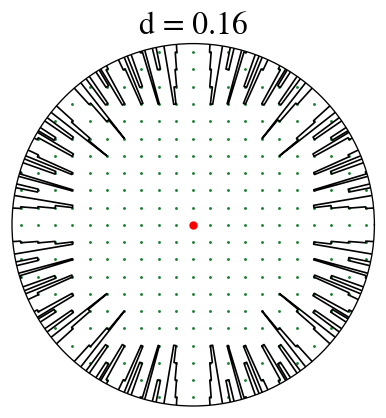

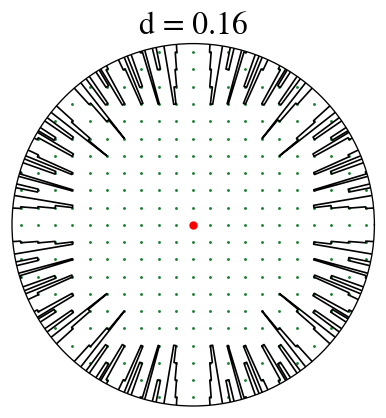

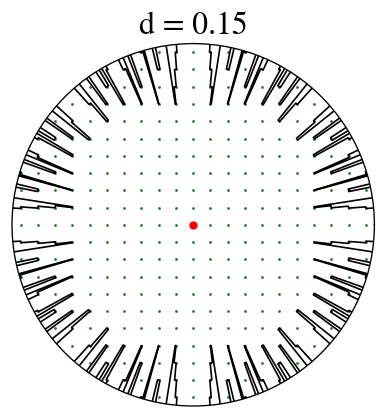

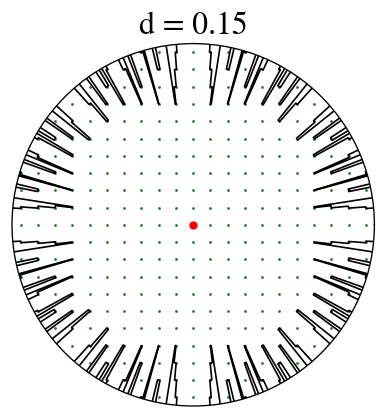

In [39]:
[generate_plot(d, idx) for idx, d in enumerate(ds)]

In [40]:
# Create a GIF
images = []
for idx in range(len(ds)):
    images.append(imageio.imread(f'cornrow_plots/frame_{idx}.png'))
imageio.mimsave('cornrow_plots/animated_plot.gif', images, fps=5)

# Cleanup: Remove individual plot images to save space
import os
for idx in range(len(ds)):
    os.remove(f'cornrow_plots/frame_{idx}.png')

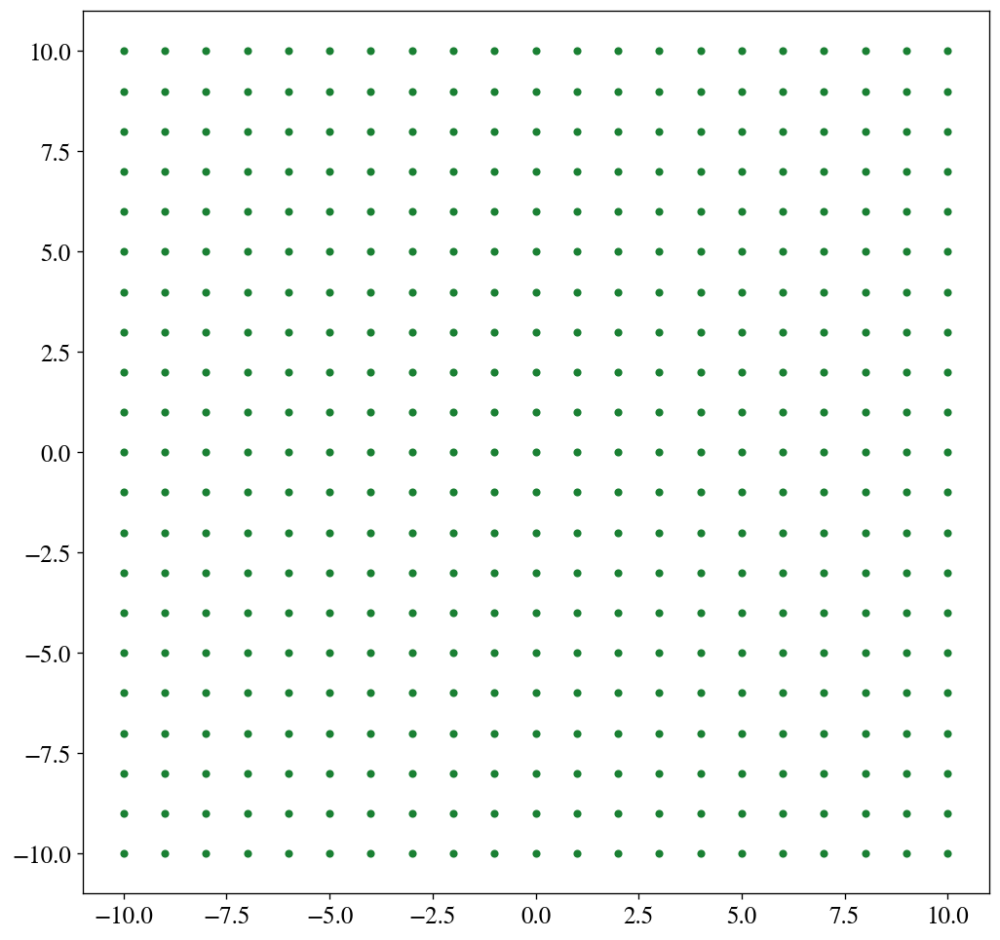

In [45]:
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(xx, yy, color=(.1,.5,.2), s=15)

# Check the "fractal-lookin'" conjecture

In [71]:
points = [(1, 0), (0, 1)]
angle_triplets = []

max_norm = 250

for _ in range(max_norm):
    new_points = []
    for i in range(len(points) - 1):
        new_points += [points[i]]
        new_x, new_y = (points[i][0] + points[i+1][0], points[i][1] + points[i+1][1])
        if new_x ** 2 + new_y ** 2 <= max_norm ** 2:
            new_points += [(new_x, new_y)]
            angle_triplets += [(
                np.arctan2(points[i][1], points[i][0]),
                np.arctan2(new_y, new_x),
                np.arctan2(points[i+1][1], points[i+1][0])
            )]
    new_points += [points[-1]]
    points = new_points

angle_triplets = np.array(angle_triplets)

In [72]:
angle_fractions = (angle_triplets[:,1] - angle_triplets[:,0]) / (angle_triplets[:,2] - angle_triplets[:,0])

(array([3071., 2958., 2966., 2937., 2983., 2984., 2937., 2966., 2958.,
        3071.]),
 array([0.00401602, 0.10321282, 0.20240961, 0.30160641, 0.4008032 ,
        0.5       , 0.5991968 , 0.69839359, 0.79759039, 0.89678718,
        0.99598398]),
 <BarContainer object of 10 artists>)

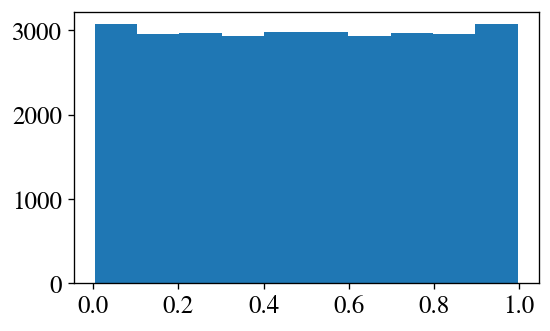

In [73]:
fig, ax = plt.subplots(figsize=(5,3))

ax.hist(angle_fractions)